In [2]:
%load_ext autoreload
%autoreload 2
from IPython.display import clear_output
import os
import fnmatch
import numpy as np
import pickle
import matplotlib.pyplot as plt
import umap

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import CuDNNLSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Flatten

from tensorflow.keras.utils import Sequence
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv1D
from scipy.stats import zscore

plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams.update(plt.rcParamsDefault)

np.random.seed(seed=11)

/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)


# Load the model (shape)

In [3]:
weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


original_dim = 128
intermediate_dim = 512
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

vae.load_weights(weights_dir)

# Load data (segments)

In [4]:
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
errors_dir = '../../../data_GRS1915/468202_len128_s2_4cad_errors_errorfix.pkl'

with open(segments_dir, 'rb') as f:
    segments = pickle.load(f)
with open(errors_dir, 'rb') as f:
    errors = pickle.load(f)


errors = ((errors)/np.expand_dims(np.std(segments, axis=1), axis=1)).astype(np.float32)
segments = zscore(segments, axis=1).astype(np.float32)  # standardize per segment

# Try reconstruction (shape)

In [5]:
try_first_x = 20
reconstructions = np.zeros((try_first_x, segments.shape[1]))
for segment_index, segment in enumerate(segments[:try_first_x]):
    reconstructions[segment_index] = vae.predict([np.expand_dims(segment, axis=0), np.expand_dims(errors[segment_index], axis=0)]).flatten()
    
plot_index = np.copy(try_first_x)-1

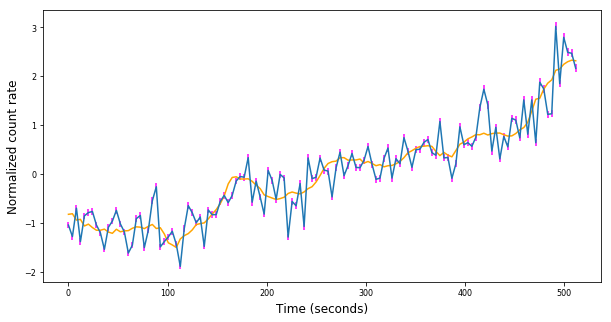

In [29]:
plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams.update({'font.size': 8})

plt.errorbar(np.linspace(0,512, 128), segments[plot_index], yerr=errors[plot_index], ecolor="magenta")
plt.plot(np.linspace(0,512, 128), reconstructions[plot_index], color="orange")
plt.ylabel("Normalized count rate", fontsize=12)
plt.xlabel("Time (seconds)", fontsize=12)
plt.show()
if plot_index>0:
    plot_index-=1

# Encode the data set (shape)

In [30]:
trained_encoder = tf.keras.Model(inputs=vae.input, outputs=[vae.get_layer("z_mean").output, vae.get_layer("z_log_var").output])
segment_encoding = np.zeros((segments.shape[0], 2, 16))
for seg_ind, seg in enumerate(segments):
    prediction = trained_encoder.predict([np.expand_dims(seg, axis=0), np.expand_dims(errors[seg_ind], axis=0)])
    segment_encoding[seg_ind][0] = prediction[0].flatten()
    segment_encoding[seg_ind][1] = prediction[1].flatten()
    print(seg_ind)
    clear_output(wait=True)
    

468201


In [33]:
segment_encoding_dir = '../../../data_GRS1915/segment_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])
# with open(segment_encoding_dir, 'wb') as f:
#     pickle.dump(segment_encoding, f)
print("Encodings saved to: ", segment_encoding_dir)

Encodings saved to:  ../../../data_GRS1915/segment_encoding_model_2020-04-29_09-12-23_segments_468202_len128_s2_4cad_counts_errorfix.pkl


# PCA the encoded data (shape)

In [10]:
weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
segment_encoding_dir = '../../../data_GRS1915/segment_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])

with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)

In [20]:
from sklearn.decomposition import IncrementalPCA, PCA

n_components = None# segment_encoding.shape[-1]
# ipca = IncrementalPCA(n_components=n_components, batch_size=468202)
pca = PCA(n_components=n_components)

# X_ipca = ipca.fit(segment_encoding[:,0,:])
X_pca = pca.fit(segment_encoding[:,0,:])

In [25]:
# X_transformed = X_ipca.transform(segment_encoding[:,0,:])
X_transformed = X_pca.transform(segment_encoding[:,0,:])

In [101]:
probe_points = np.zeros((5,10,16))#5 PCs, 10 points, 16 coordinates

for PC, eigen_vec in enumerate(pca.components_[:5]):#first 5 components give 78% of explained variance, next one is 4.3%
    bins = np.linspace(np.min(X_transformed[:,PC]),np.max(X_transformed[:,PC]), 11)
    binned_indices = np.digitize(X_transformed[:,PC], bins)
    for bin_index in range(10):
        bin_segment_indices = np.where(binned_indices == bin_index+1)[0]
        probe_points[PC,bin_index,:] = np.mean(X_transformed[bin_segment_indices], axis=0)
#     tenth_range = (np.max(X_transformed[:,PC]) - np.min(X_transformed[:,PC]))/10
#     for point in range(10):
#         probe_points[PC,point,:] = eigen_vec
#     np.max(X_transformed[:,PC])/tenth_range
    

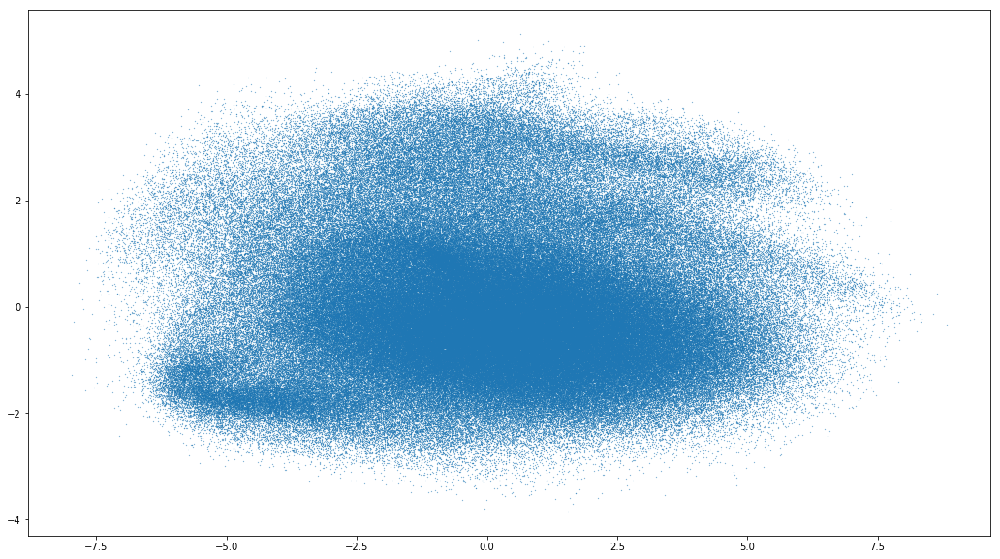

In [25]:
umaped_data = X_transformed
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(X_transformed[:,0], X_transformed[:,1], s=0.05)

# UMAP the encoded data (shape)

In [77]:
with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)

In [78]:
UMAP_mapper = umap.UMAP(verbose=True)#n_neighbors=50, min_dist=0.0, local_connectivity, repulsion_strength, negative_sample_rate
UMAP_mapper.fit(segment_encoding[:100000,0,:])


UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Tue May 19 07:38:17 2020 Finding Nearest Neighbors
Tue May 19 07:38:17 2020 Building RP forest with 21 trees
Tue May 19 07:38:21 2020 NN descent for 17 iterations
	 0  /  17
	 1  /  17
	 2  /  17
	 3  /  17
	 4  /  17
Tue May 19 07:38:36 2020 Finished Nearest Neighbor Search
Tue May 19 07:38:39 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)

In [81]:
# with open('../../../data_GRS1915/fast_UMAPmapper_means_{}.pkl'.format(segment_encoding_dir.split("/")[-1]), 'wb') as f:
#     pickle.dump(UMAP_mapper, f)

In [11]:
with open('../../../data_GRS1915/fast_UMAPmapper_means_{}.pkl'.format(segment_encoding_dir.split("/")[-1]), 'rb') as f:
    UMAP_mapper = pickle.load(f)

In [79]:
umaped_data = UMAP_mapper.transform(segment_encoding[:,0,:])

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


In [102]:
encoded_probes = np.zeros((5,10,2))

for n, PC in enumerate(probe_points):
    UMAPed_PC_centroids = UMAP_mapper.transform(PC)
    encoded_probes[n] = UMAPed_PC_centroids

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs
	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs
	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs
	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30

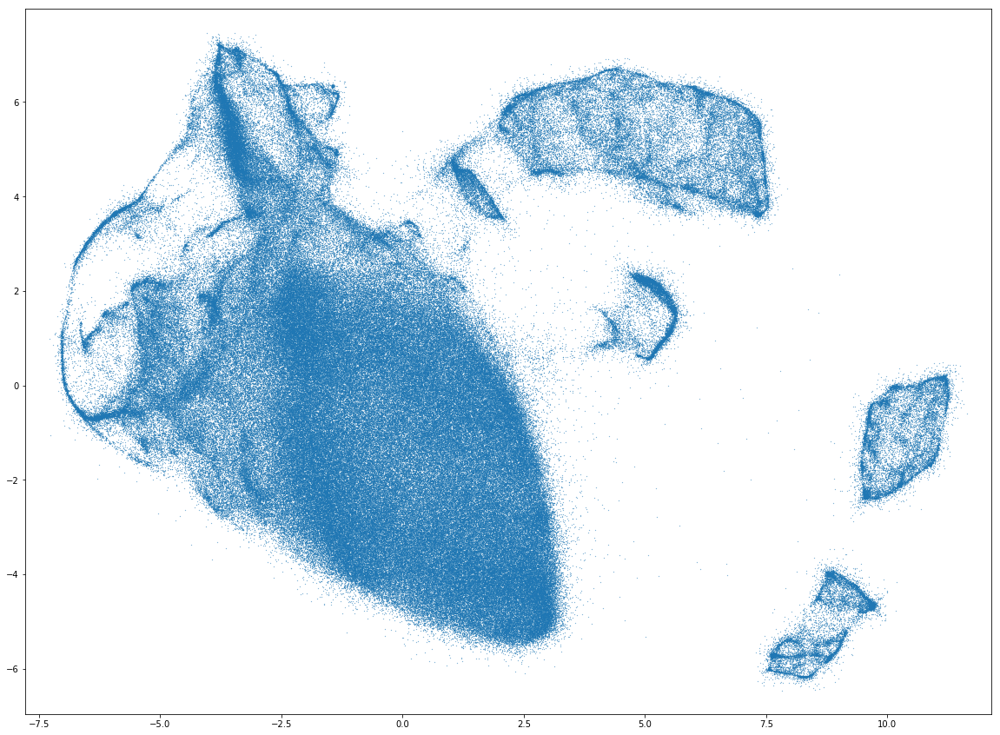

In [6]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

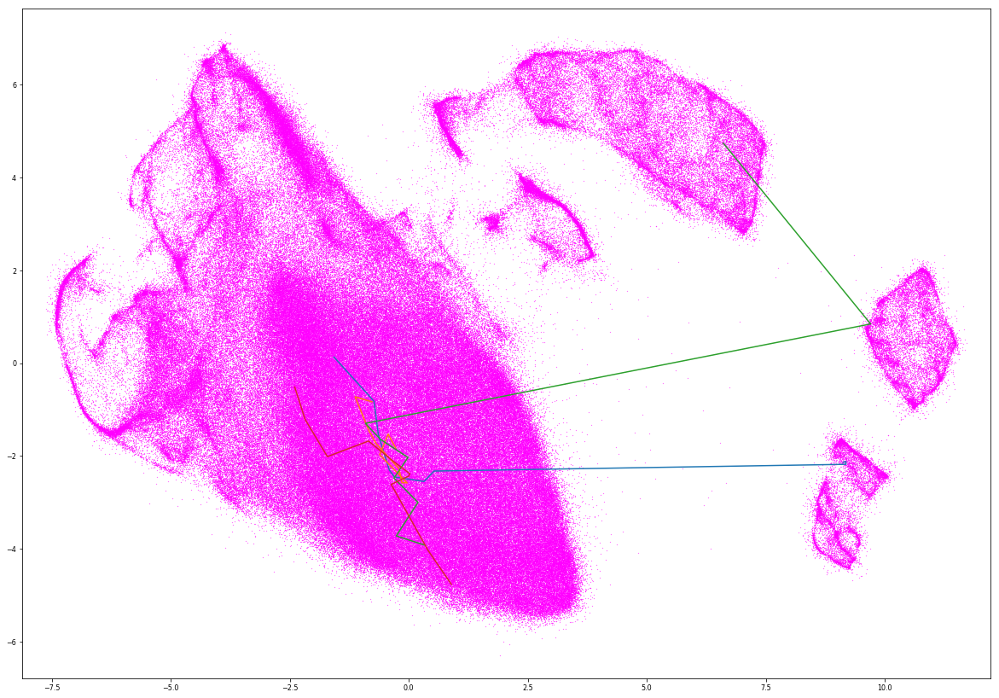

In [117]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05, c="magenta")
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])

for pc in encoded_probes[:4]:
    plt.plot(pc[:,0], pc[:,1])
    
plt.show()

# Generate synthetic samples along principal components(shape)

In [106]:
weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


original_dim = 128
intermediate_dim = 512
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

vae.load_weights(weights_dir)

In [110]:
generated_samples

array([[[-7.93315291e-01, -3.11019874e+00,  4.28947115e+00, ...,
         -4.18205404e+00, -4.63173294e+00, -4.39517975e+00],
        [-1.24123621e+00, -3.08619761e+00,  1.44935846e-02, ...,
         -3.55539656e+00, -1.51216745e+00, -1.87253988e+00],
        [-1.58591282e+00, -2.07327509e+00,  1.70606852e+00, ...,
         -4.78336334e+00, -3.78642130e+00, -5.07390738e+00],
        ...,
        [ 4.16005659e+00,  3.41157913e-01, -2.22268963e+00, ...,
         -1.71786308e+00, -2.06260180e+00, -1.52839923e+00],
        [ 4.95422220e+00,  1.27502584e+00, -2.04314113e+00, ...,
         -2.36809492e-01,  1.07931495e-01, -3.03162098e-01],
        [ 5.22758532e+00,  2.56822538e+00, -2.07272506e+00, ...,
          1.57225847e+00,  1.36001396e+00,  1.33662558e+00]],

       [[-4.28754330e-01, -4.16416168e+00, -4.33923388e+00, ...,
         -4.28966045e+00, -3.91429472e+00, -4.11001682e+00],
        [-5.37846565e-01, -6.01118898e+00, -2.24846125e+00, ...,
         -5.24587393e+00, -4.76984072e

In [109]:
trained_decoder = tf.keras.Model(inputs=vae.get_layer("decoder").input, outputs=vae.get_layer("decoder").output)
generated_samples = np.zeros((5,10, 128))
for n_PC, PC in enumerate(probe_points):
    for n_point, point in enumerate(PC):
        prediction = trained_decoder.predict(np.expand_dims(point, axis=0))
        generated_samples[n_PC,n_point, :] = prediction.flatten()

        print(n_point)
        clear_output(wait=True)


9


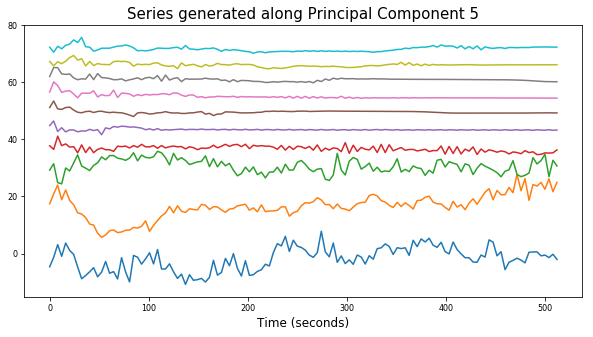

In [128]:
plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams.update({'font.size': 8})
plot_index = 0
PC_ind = 4
# plt.errorbar(np.linspace(0,512, 128), segments[plot_index], yerr=errors[plot_index], ecolor="magenta")
offset = 0
for n_lc, lc in enumerate(generated_samples[PC_ind]):
    if n_lc>0:
        offset += np.max(generated_samples[PC_ind, n_lc])-np.min(generated_samples[PC_ind, n_lc])
    plt.plot(np.linspace(0,512, 128), generated_samples[PC_ind, n_lc]+offset)
# plt.ylabel("Normalized count rate", fontsize=12)
plt.xlabel("Time (seconds)", fontsize=12)
plt.title("Series generated along Principal Component {}".format(PC_ind+1), fontsize=15)
plt.show()
if plot_index>0:
    plot_index-=1

# Cluster the latent space(shape)

In [166]:
from sklearn.mixture import GaussianMixture

clf = GaussianMixture(n_components=20, covariance_type='full', verbose=1)
clf.fit(segment_encoding[:100000,0,:])
# aics[n_comps] = clf.aic(segment_encoding[:,0,:])
# print(n_comps)

Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
Initialization converged: True


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
        means_init=None, n_components=20, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

In [167]:
custer_labels = clf.predict(segment_encoding[:,0,:])

In [168]:
transformed_means = UMAP_mapper.transform(clf.means_)

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


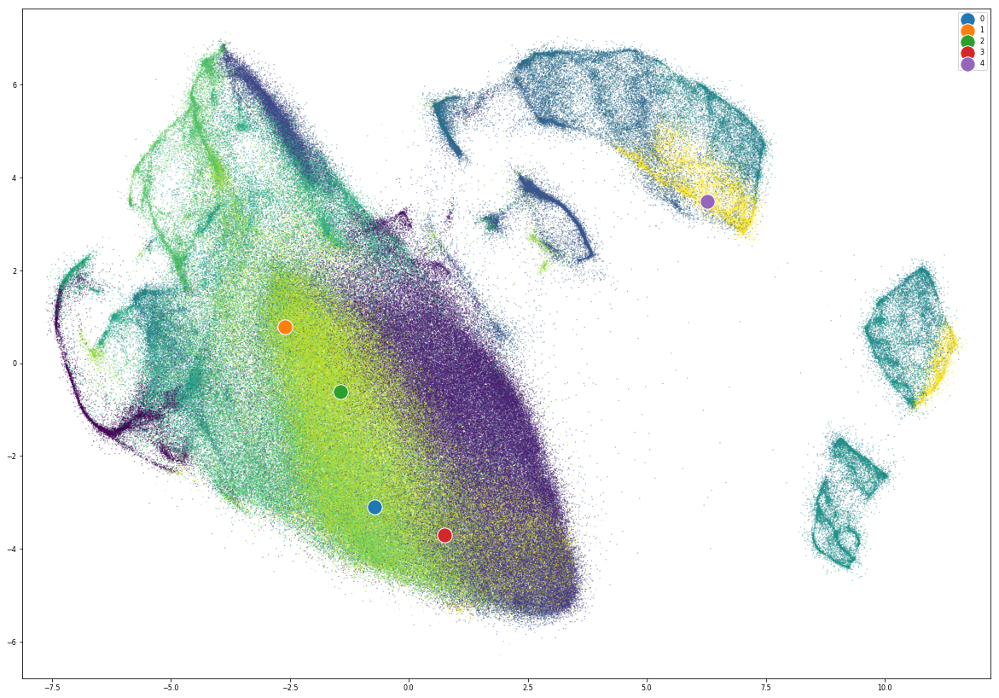

In [183]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05, c=custer_labels)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
for mean_n, mean in enumerate(transformed_means[15:]):
    plt.scatter(mean[0], mean[1], s=300, label=mean_n, edgecolors="white")
plt.legend()
plt.show()

# Generate synthetic samples from Gaussian centroids (shape)

In [106]:
weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


original_dim = 128
intermediate_dim = 512
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

vae.load_weights(weights_dir)

In [110]:
trained_decoder = tf.keras.Model(inputs=vae.get_layer("decoder").input, outputs=vae.get_layer("decoder").output)

array([[[-7.93315291e-01, -3.11019874e+00,  4.28947115e+00, ...,
         -4.18205404e+00, -4.63173294e+00, -4.39517975e+00],
        [-1.24123621e+00, -3.08619761e+00,  1.44935846e-02, ...,
         -3.55539656e+00, -1.51216745e+00, -1.87253988e+00],
        [-1.58591282e+00, -2.07327509e+00,  1.70606852e+00, ...,
         -4.78336334e+00, -3.78642130e+00, -5.07390738e+00],
        ...,
        [ 4.16005659e+00,  3.41157913e-01, -2.22268963e+00, ...,
         -1.71786308e+00, -2.06260180e+00, -1.52839923e+00],
        [ 4.95422220e+00,  1.27502584e+00, -2.04314113e+00, ...,
         -2.36809492e-01,  1.07931495e-01, -3.03162098e-01],
        [ 5.22758532e+00,  2.56822538e+00, -2.07272506e+00, ...,
          1.57225847e+00,  1.36001396e+00,  1.33662558e+00]],

       [[-4.28754330e-01, -4.16416168e+00, -4.33923388e+00, ...,
         -4.28966045e+00, -3.91429472e+00, -4.11001682e+00],
        [-5.37846565e-01, -6.01118898e+00, -2.24846125e+00, ...,
         -5.24587393e+00, -4.76984072e

In [184]:
no_samples = 5
generated_samples = np.zeros((no_samples, 128))
for n_point, point in enumerate(clf.means_[15:]):
    prediction = trained_decoder.predict(np.expand_dims(point, axis=0))
    generated_samples[n_point, :] = prediction.flatten()

    print(n_point)
    clear_output(wait=True)


4


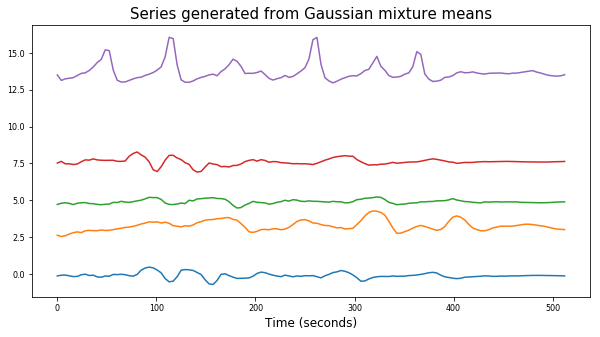

In [185]:
plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams.update({'font.size': 8})
plot_index = 0
PC_ind = 4
# plt.errorbar(np.linspace(0,512, 128), segments[plot_index], yerr=errors[plot_index], ecolor="magenta")
offset = 0
for n_lc, lc in enumerate(generated_samples):
    if n_lc>0:
        offset += np.max(lc)-np.min(lc)+ (np.max(generated_samples[n_lc])-np.min(generated_samples[n_lc]))
    plt.plot(np.linspace(0,512, 128), lc+offset)
# plt.ylabel("Normalized count rate", fontsize=12)
plt.xlabel("Time (seconds)", fontsize=12)
plt.title("Series generated from Gaussian mixture means", fontsize=15)
plt.show()
if plot_index>0:
    plot_index-=1

# Overplot UMAP with the classified data (shape)

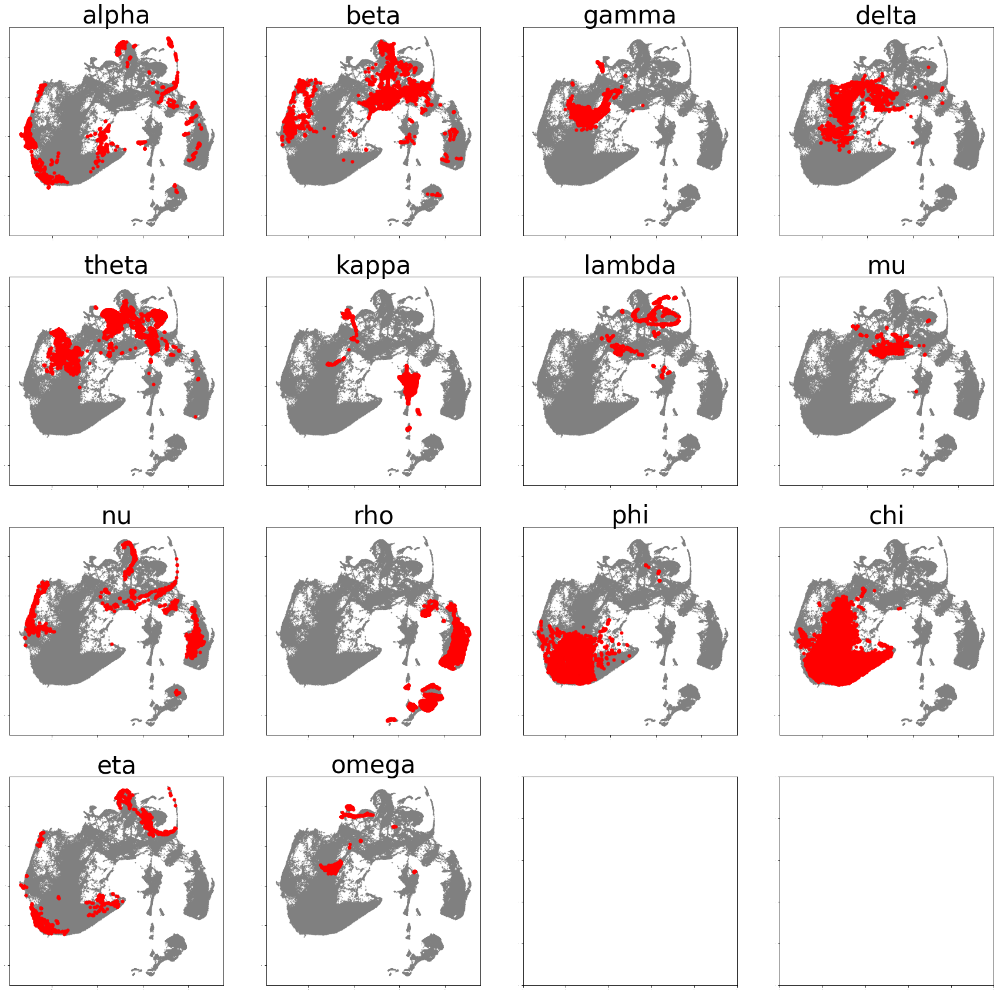

In [145]:
# load observation classifications from Huppenkothen 2017
# %matplotlib inline

# import matplotlib.pyplot as plt


clean_belloni = open('../../../data_GRS1915/1915Belloniclass_updated.dat')
lines = clean_belloni.readlines()
states = lines[0].split()
belloni_clean = {}
for h,l in zip(states, lines[1:]):
    belloni_clean[h] = l.split()
    #state: obsID1, obsID2...
ob_state = {}
for state, obs in belloni_clean.items():
    if state == "chi1" or state == "chi2" or state == "chi3" or state == "chi4": state = "chi"
    for ob in obs:
        ob_state[ob] = state
        
# load segmented light curves

import pickle
with open('../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/468202_len128_s2_4cad_ids_errorfix.pkl', 'rb') as f:
    seg_ids = pickle.load(f)

# # HF QPO observation ids
# paper_obIDs = np.loadtxt("../../../data_GRS1915/Belloni_Altamirano_obsIDs.txt", dtype=str)

# qpo_colours = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_colours.append("red")
#     else:
#         qpo_colours.append("grey")
        
# qpo_labels = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_labels.append("QPO")
#     else:
#         qpo_labels.append("other")
        
        
# qpo_scales = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_scales.append("QPO")
#     else:
#         qpo_scales.append("other")
        
        
xxx = [seg.split("_")[0] for seg in seg_ids]

classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
class_colour = []
for ob in xxx:
    if ob in ob_state:
        class_colour.append(np.where(classes == ob_state[ob])[0][0])
    else:
        class_colour.append(15)
        
classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
scales = []
segment_class = []
for ob in xxx:
    if ob in ob_state:
        segment_class.append(ob_state[ob])
        scales.append(5)
    else:
        segment_class.append("Unknown")
        scales.append(0.1)
        
        
from matplotlib import cm
cm.get_cmap(plt.get_cmap("Set1"))


colours = ['#ffd8b1', '#000075', '#808080', '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#000000']

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# sns.set_style("white")
plt.rcParams['figure.figsize'] = (30.0, 30.0)
plt.rcParams.update({'font.size': 0})

embeddings_lap = umaped_data

# fig, ax = plt.subplots()

fig, axs = plt.subplots(4, 4)
axs = axs.flatten()

for plot_class_ind, plot_class in enumerate(classes):
    class_indices = np.where(np.array(segment_class) == "Unknown")[0]
    class_data = embeddings_lap[class_indices]
    axs[plot_class_ind].scatter(class_data[:,0], class_data[:,1], s = 0.2, c="grey", label="Unknown")

    class_indices = np.where(np.array(segment_class) == plot_class)[0]
    class_data = embeddings_lap[class_indices]
    
    axs[plot_class_ind].scatter(class_data[:,0], class_data[:,1], s = 25, c='red', label=plot_class)
    
# plt.legend()
    axs[plot_class_ind].set_title("{}".format(plot_class), fontsize=42)
axs.reshape((4,4))
# plt.savefig("classes_separate.png")

# plt.savefig("UMAP_embedding_separate_classes_model_2020-02-09_10-36-06.png")
plt.show()


# redint = np.where(np.array(qpo_colours) == "red")
# greyint= np.where(np.array(qpo_colours) != "red")
# plt.scatter(embeddings_lap[:,0][greyint], embeddings_lap[:,1][greyint], s=1, c="grey", label= "other")
# plt.scatter(embeddings_lap[:,0][redint], embeddings_lap[:,1][redint], s=1, c="red", label= "HF QPO")
# plt.title("UMAP embedding of the encoded GRS1915 segments, neighbors=50, min_dist=0.0, components=2", fontsize=12)
# plt.legend()
# plt.show()

# Histogram reconstruction

In [6]:
weights_dir = "../../../model_weights/model_2020-04-29_13-04-35.h5" #24>16>24
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_histograms_24bin_0-13k_errorfix.pkl'

In [3]:
with open(segments_dir, 'rb') as f:
    segments = pickle.load(f)
# with open('../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(segments, axis=None).astype(np.float32)  # standardize


class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

original_dim = 24
intermediate_dim = 64
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=original_inputs, outputs=outputs, name='vae')


vae.load_weights(weights_dir)

In [4]:
try_first_x = 200
hist_reconstructions = np.zeros((try_first_x, segments.shape[1]))
for segment_index, segment in enumerate(segments[:try_first_x]):
    hist_reconstructions[segment_index] = vae.predict(np.expand_dims(segment, axis=0)).flatten()
    
plot_index = np.copy(try_first_x)-1

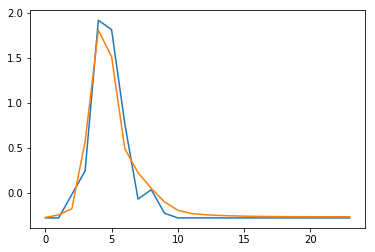

In [5]:
plt.plot(segments[plot_index])
plt.plot(hist_reconstructions[plot_index])
plt.show()
if plot_index>0:
    plot_index-=1

# Encode the data set (histograms)

In [ ]:
trained_encoder = tf.keras.Model(inputs=vae.input, outputs=[vae.get_layer("z_mean").output, vae.get_layer("z_log_var").output])
segment_encoding = np.zeros((segments.shape[0], 2, 16))
for seg_ind, seg in enumerate(segments):
    prediction = trained_encoder.predict(np.expand_dims(seg, axis=0))
    segment_encoding[seg_ind][0] = prediction[0].flatten()
    segment_encoding[seg_ind][1] = prediction[1].flatten()
    print(seg_ind)
    clear_output(wait=True)
    

466093


In [18]:
weights_dir = "../../../model_weights/model_2020-04-29_13-04-35.h5" #24>16>24

segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_histograms_24bin_0-13k_errorfix.pkl'
segment_encoding_dir = '../../../data_GRS1915/histogram_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])
# with open(segment_encoding_dir, 'wb') as f:
#     pickle.dump(segment_encoding, f)
print("Encodings saved to: ", segment_encoding_dir)

Encodings saved to:  ../../../data_GRS1915/histogram_encoding_model_2020-04-29_13-04-35_segments_468202_len128_s2_4cad_histograms_24bin_0-13k_errorfix.pkl


# UMAP the encoded data (histograms)

In [19]:
with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)

In [3]:
with open(segments_dir, 'rb') as f:
    segments = pickle.load(f)
# with open('../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(segments, axis=None).astype(np.float32)  # standardize

In [9]:
UMAP_mapper = umap.UMAP(verbose=True)#n_neighbors=50, min_dist=0.0
UMAP_mapper.fit(segment_encoding[:100000,:,0])

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Mon May 25 18:31:19 2020 Finding Nearest Neighbors
Mon May 25 18:31:19 2020 Building RP forest with 21 trees
Mon May 25 18:31:22 2020 NN descent for 17 iterations
	 0  /  17
	 1  /  17
	 2  /  17
Mon May 25 18:31:31 2020 Finished Nearest Neighbor Search
Mon May 25 18:31:33 2020 Construct embedding


/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 25 separate connected components using meta-embedding (experimental)
  n_components


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Mon May 25 18:40:44 2020 Finished embedding


UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)

In [10]:
umaped_data = UMAP_mapper.transform(segment_encoding[:,:,0])

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


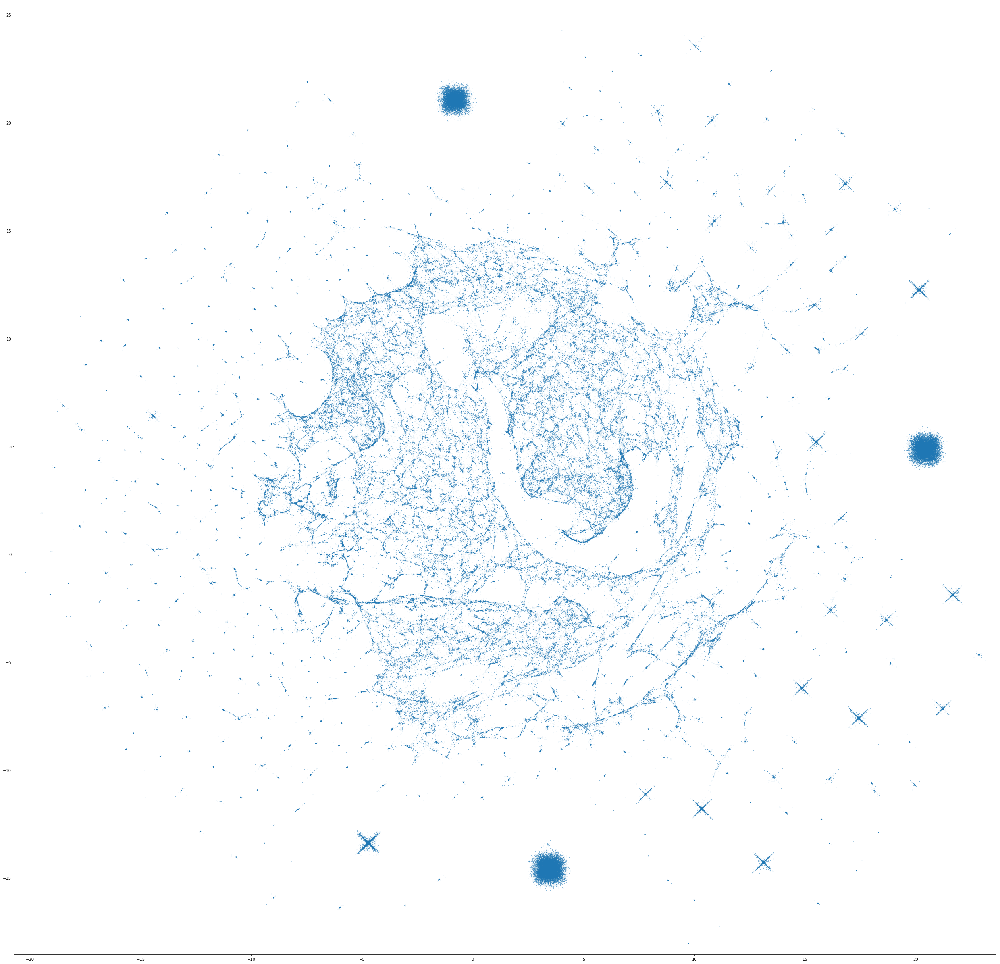

In [11]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

# Cluster the latent space (histograms)

In [51]:
from sklearn.mixture import GaussianMixture

clf = GaussianMixture(n_components=100, covariance_type='full', verbose=1)
clf.fit(segment_encoding[:100000,0,:])
# aics[n_comps] = clf.aic(segment_encoding[:,0,:])
# print(n_comps)

Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
Initialization converged: True


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
        means_init=None, n_components=100, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

In [52]:
custer_labels = clf.predict(segment_encoding[:,0,:])

In [53]:
transformed_means = UMAP_mapper.transform(clf.means_)

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


In [55]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
color_matched_9 = ["#a8a495" if x>9 else colors[x] for x in custer_labels]
# color_matched_19= ["#a8a495" if x<=9 else colors[x-10] for x in custer_labels]

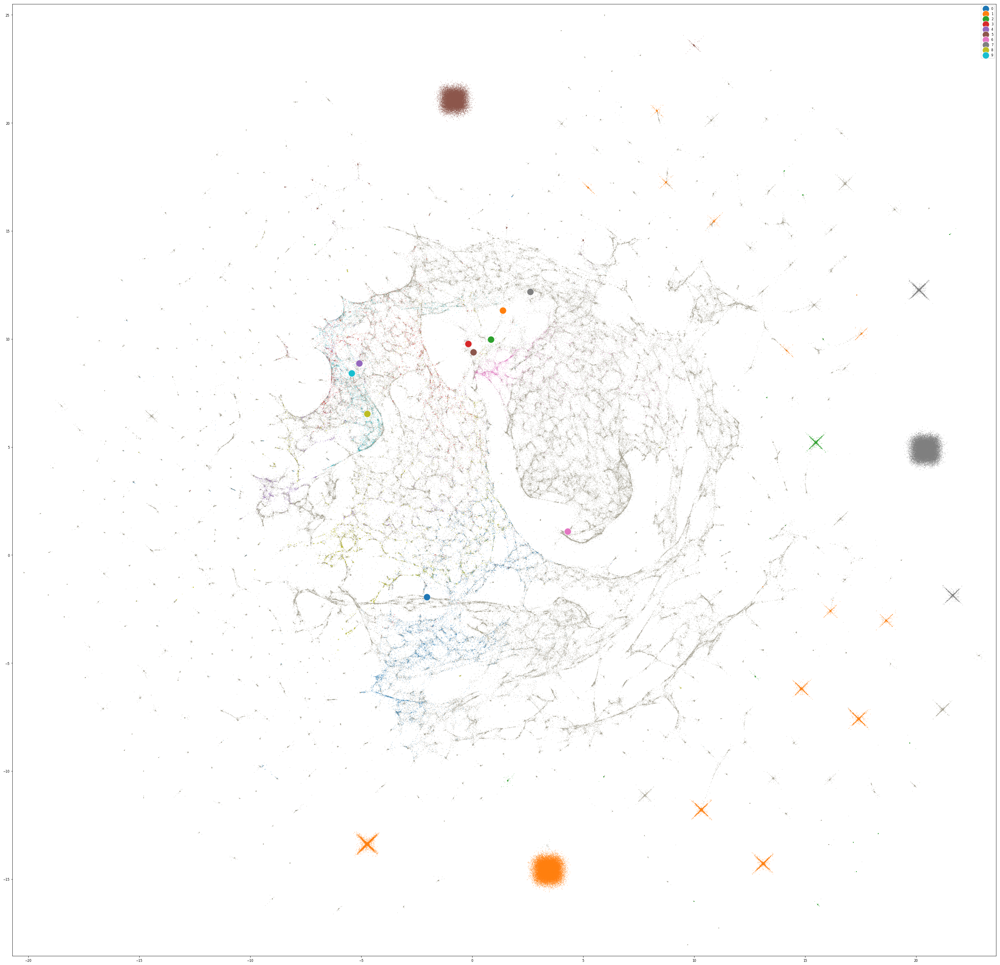

In [57]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

color_matched_9 = ["#a8a495" if x>9 else colors[x] for x in custer_labels]
# color_matched_19= ["#a8a495" if x<=9 else colors[x-10] for x in custer_labels]

plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05, c=color_matched_9)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
for mean_n, mean in enumerate(transformed_means[:10]):
    plt.scatter(mean[0], mean[1], s=300, label=mean_n, edgecolors="white")
plt.legend()
plt.show()

# Generate synthetic samples (histograms)

In [58]:
weights_dir = "../../../model_weights/model_2020-04-29_13-04-35.h5" #24>16>24

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


original_dim = 24
intermediate_dim = 64
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

vae.load_weights(weights_dir)

In [46]:
trained_decoder = tf.keras.Model(inputs=vae.get_layer("decoder").input, outputs=vae.get_layer("decoder").output)

In [59]:
no_samples = 10
generated_samples = np.zeros((no_samples, 24))
for n_point, point in enumerate(clf.means_[:10]):
    prediction = trained_decoder.predict(np.expand_dims(point, axis=0))
    generated_samples[n_point, :] = prediction.flatten()

    print(n_point)
    clear_output(wait=True)


9


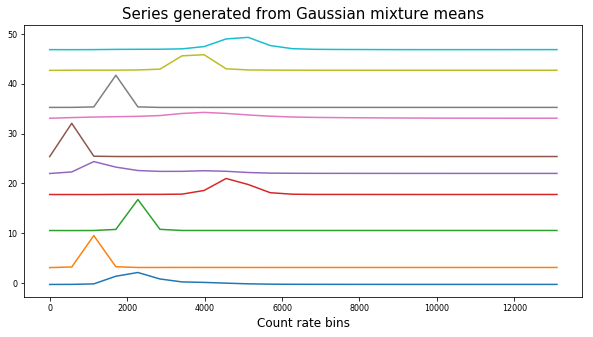

In [61]:
plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams.update({'font.size': 8})
plot_index = 0
PC_ind = 4
# plt.errorbar(np.linspace(0,512, 128), segments[plot_index], yerr=errors[plot_index], ecolor="magenta")
offset = 0
for n_lc, lc in enumerate(generated_samples):
    if n_lc>0:
        offset += np.max(generated_samples[n_lc-1])-np.min(generated_samples[n_lc-1]) +1
    plt.plot(np.linspace(0,13100, num=24), lc+offset)
# plt.ylabel("Normalized count rate", fontsize=12)
plt.xlabel("Count rate bins", fontsize=12)
plt.title("Series generated from Gaussian mixture means", fontsize=15)
plt.show()
if plot_index>0:
    plot_index-=1

# UMAP the raw histogram data

In [132]:
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_histograms_24bin_0-13k_errorfix.pkl'
with open(segments_dir, 'rb') as f:
    segments = pickle.load(f)
segments = zscore(segments, axis=None).astype(np.float32)  # standardize

In [133]:
UMAP_mapper = umap.UMAP(verbose=True)#n_neighbors=50, min_dist=0.0
UMAP_mapper.fit(segments[:,:,0])

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Wed May 27 10:58:54 2020 Finding Nearest Neighbors
Wed May 27 10:58:54 2020 Building RP forest with 39 trees
Wed May 27 10:59:31 2020 NN descent for 19 iterations
	 0  /  19
	 1  /  19
Wed May 27 11:00:14 2020 Finished Nearest Neighbor Search
Wed May 27 11:00:28 2020 Construct embedding


/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 459 separate connected components using meta-embedding (experimental)
  n_components


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed May 27 13:18:35 2020 Finished embedding


UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)

In [134]:
# with open('../../../data_GRS1915/UMAPmapper_raw_histograms_trainedonall.pkl', 'wb') as f:
#     pickle.dump(UMAP_mapper, f)

In [135]:
umaped_data = UMAP_mapper.transform(segments[:,:,0])

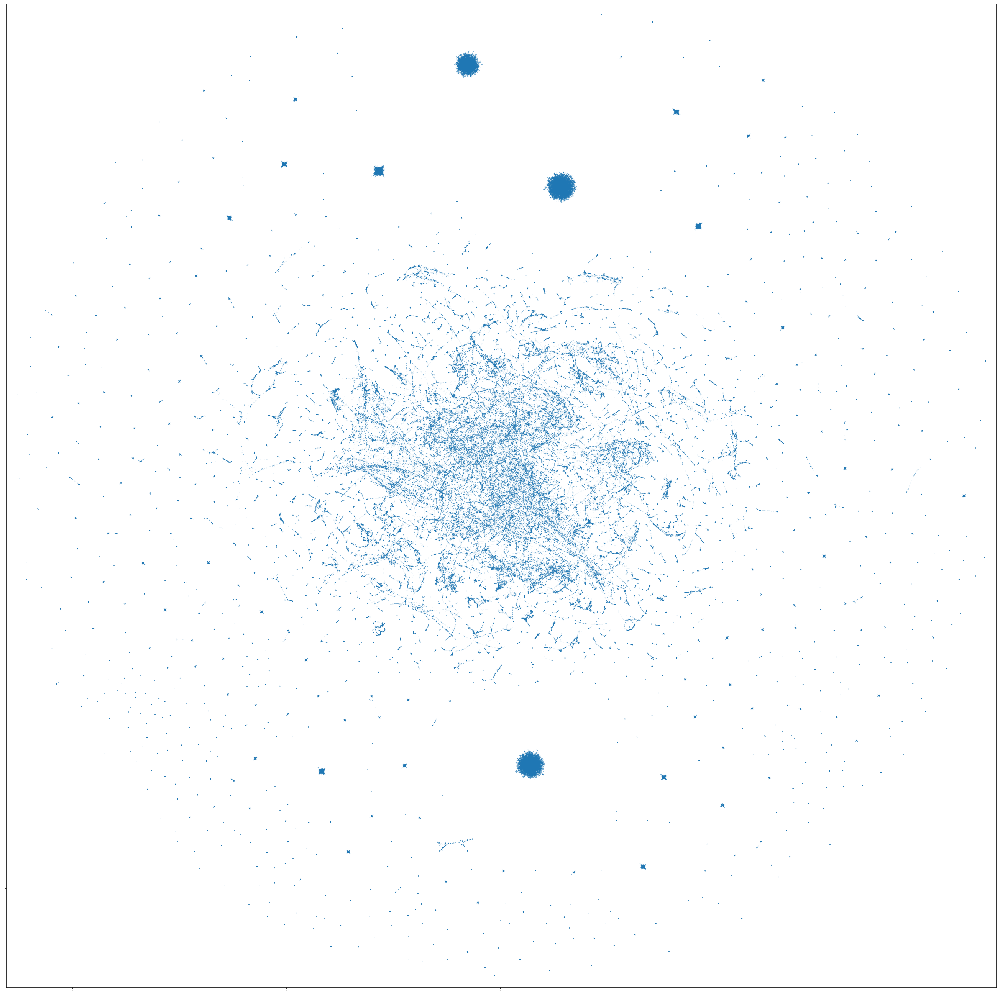

In [136]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

# Cluster the raw histograms

In [30]:
from sklearn.mixture import GaussianMixture

clf = GaussianMixture(n_components=200, covariance_type='full', verbose=1)
clf.fit(segments[:10000,:,0])
# aics[n_comps] = clf.aic(segment_encoding[:,0,:])
# print(n_comps)

Initialization 0
  Iteration 10
  Iteration 20
Initialization converged: True


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
        means_init=None, n_components=200, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

In [15]:
segments.shape

(468202, 24, 1)

In [31]:
custer_labels = clf.predict(segments[:,:,0])

In [32]:
custer_labels = clf.predict(segments[:,:,0])
transformed_means = UMAP_mapper.transform(clf.means_)

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


In [33]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
color_matched_9 = ["#a8a495" if x>9 else colors[x] for x in custer_labels]
# color_matched_19= ["#a8a495" if x<=9 else colors[x-10] for x in custer_labels]

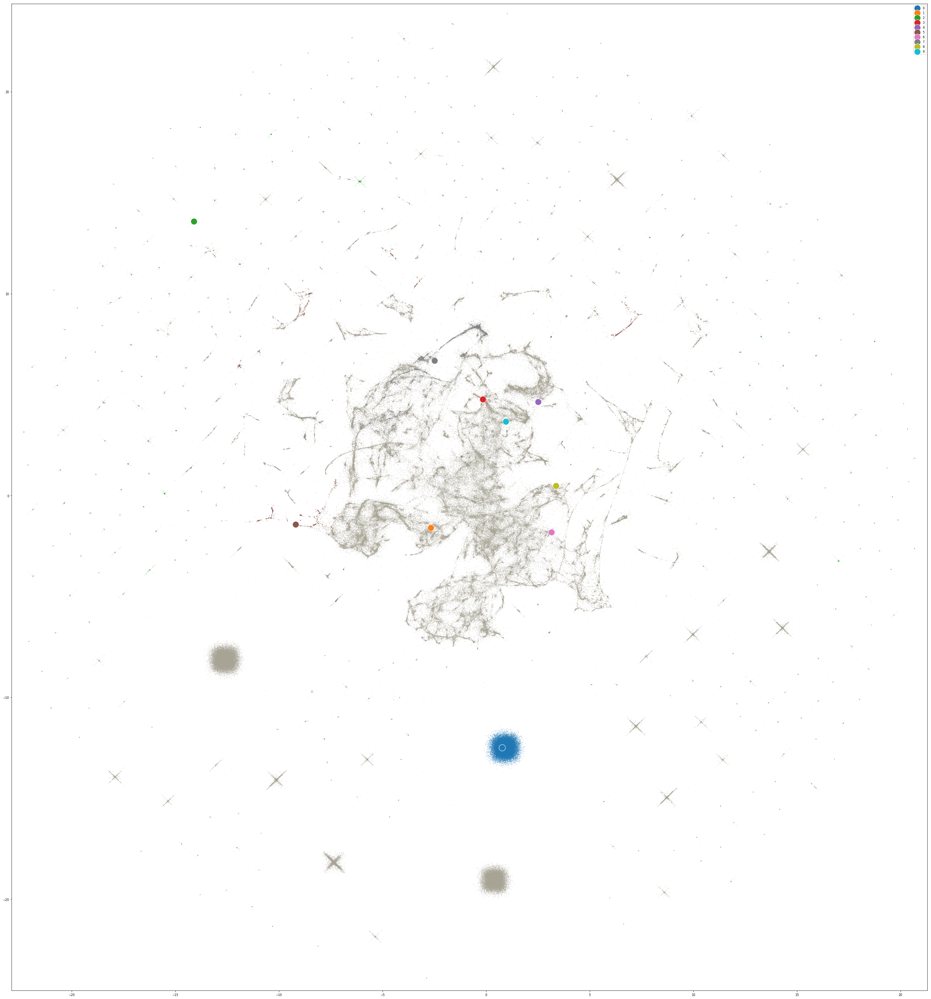

In [34]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05, c=color_matched_9)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
for mean_n, mean in enumerate(transformed_means[:10]):
    plt.scatter(mean[0], mean[1], s=300, label=mean_n, edgecolors="white")
plt.legend()
plt.show()

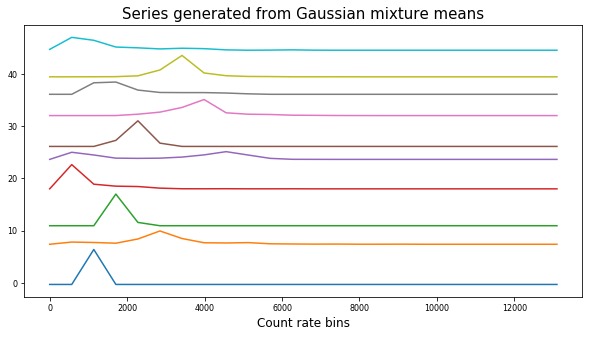

In [35]:
plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams.update({'font.size': 8})
plot_index = 0
PC_ind = 4
# plt.errorbar(np.linspace(0,512, 128), segments[plot_index], yerr=errors[plot_index], ecolor="magenta")
offset = 0
for n_lc, lc in enumerate(clf.means_[:10]):
    if n_lc>0:
        offset += np.max(clf.means_[n_lc-1])-np.min(clf.means_[n_lc-1]) +1
    plt.plot(np.linspace(0,13100, num=24), lc+offset)
# plt.ylabel("Normalized count rate", fontsize=12)
plt.xlabel("Count rate bins", fontsize=12)
plt.title("Series generated from Gaussian mixture means", fontsize=15)
plt.show()
if plot_index>0:
    plot_index-=1

# UMAP Shape and intensity combination (16 shape latent variables and 24 histogram bin populations) 

In [3]:
hist_dir = '../../../data_GRS1915/468202_len128_s2_4cad_histograms_24bin_0-13k_errorfix.pkl'
with open(hist_dir, 'rb') as f:
    hists = pickle.load(f)
# with open('../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
hists = zscore(hists[:,:,0], axis=None).astype(np.float32)  # standardize


weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
segment_encoding_dir = '../../../data_GRS1915/segment_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])

with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)
    
segment_encoding_scaled_means = zscore(segment_encoding[:,0,:], axis=None).astype(np.float32)  # standardize


In [4]:
SAI_data = np.hstack((segment_encoding_scaled_means, hists))
SAI_data.shape

(468202, 40)

In [47]:
UMAP_mapper = umap.UMAP(verbose=True)#n_neighbors=50, min_dist=0.0
UMAP_mapper.fit(SAI_data[:50000,:])
umaped_data = UMAP_mapper.transform(SAI_data)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Tue May 26 08:02:29 2020 Finding Nearest Neighbors
Tue May 26 08:02:29 2020 Building RP forest with 16 trees
Tue May 26 08:02:31 2020 NN descent for 16 iterations
	 0  /  16
	 1  /  16
	 2  /  16
	 3  /  16
Tue May 26 08:02:37 2020 Finished Nearest Neighbor Search
Tue May 26 08:02:39 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epoc

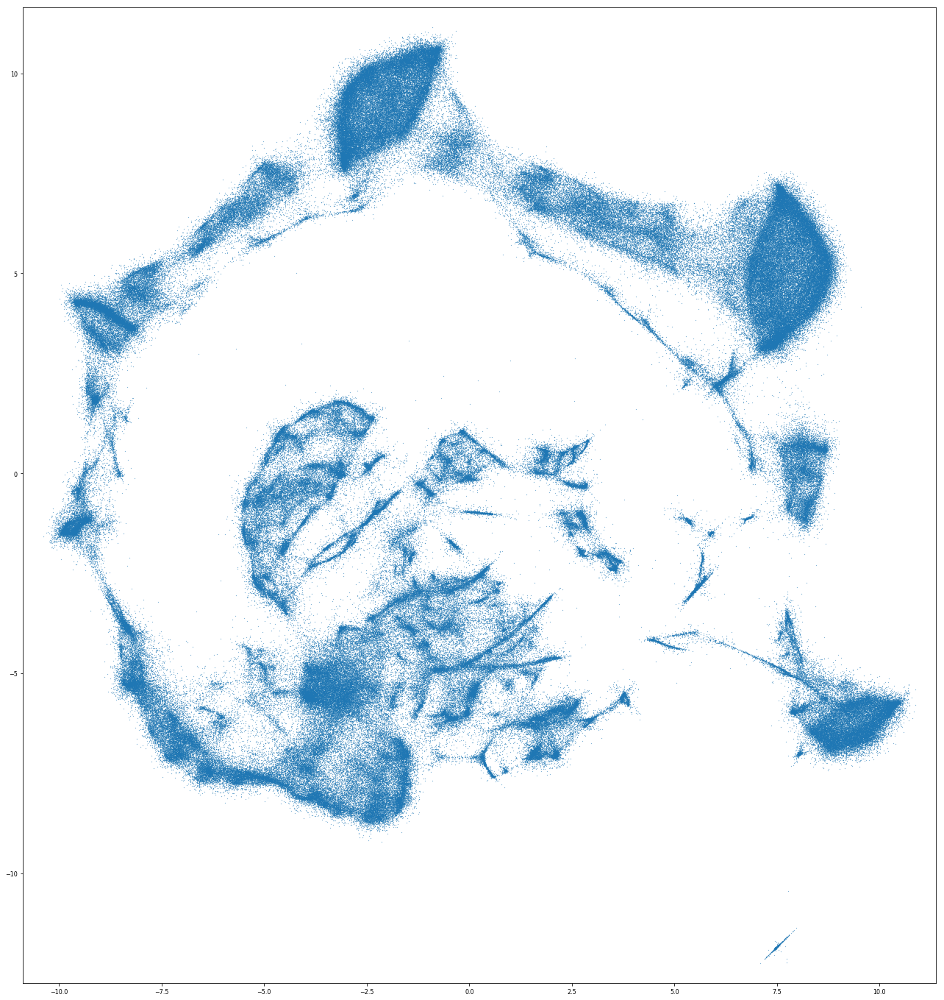

In [48]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

# Cluster the shape and intensity features

In [106]:
from sklearn.mixture import GaussianMixture
criteria111_114 = np.zeros((2,4))


for ind, n_components in enumerate([111, 112, 113, 114]):

    clf = GaussianMixture(n_components=n_components, covariance_type='full', verbose=1)
    clf.fit(SAI_data[:50000,:])
    
#     with open('../../../data_GRS1915/SAI_GM_components{}_fitto50k_v2.pkl'.format(n_components), 'wb') as f:
#         pickle.dump(clf, f)
    
    criteria111_114[0,ind] = clf.aic(SAI_data)
    criteria111_114[1,ind] = clf.bic(SAI_data)
    print(n_components, criteria111_114[:,ind])

Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
Initialization converged: True
111 [-1.02402924e+08 -1.01346240e+08]
Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True
112 [-1.02073242e+08 -1.01007038e+08]
Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
  Iteration 60
Initialization converged: True
113 [-1.02495179e+08 -1.01419455e+08]
Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True
114 [-1.02422352e+08 -1.01337108e+08]


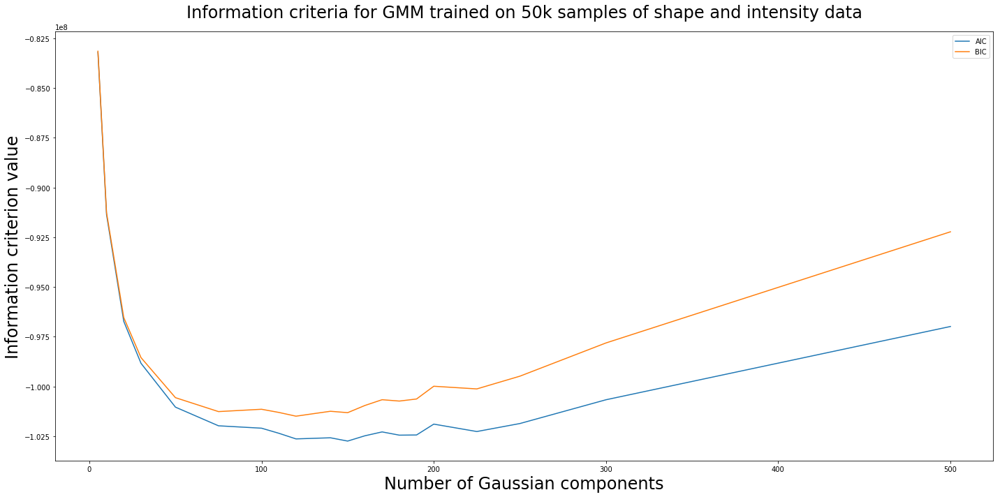

In [101]:
plt.rcParams['figure.figsize'] =[20,10]

plt.plot([5,10,20,30,50,75,100,110,120,130,140,150,160,170,180,190,200,225,250,300,500], criteria4[0,:], label="AIC") #125
plt.plot([5,10,20,30,50,75,100,110,120,130,140,150,160,170,180,190,200,225,250,300,500], criteria4[1,:], label="BIC") #125
plt.title("Information criteria for GMM trained on 50k samples of shape and intensity data", pad=20, fontsize=24)
plt.ylabel("Information criterion value", fontsize=24)
plt.xlabel("Number of Gaussian components", fontsize=24)
plt.legend()
plt.tight_layout()
plt.show()

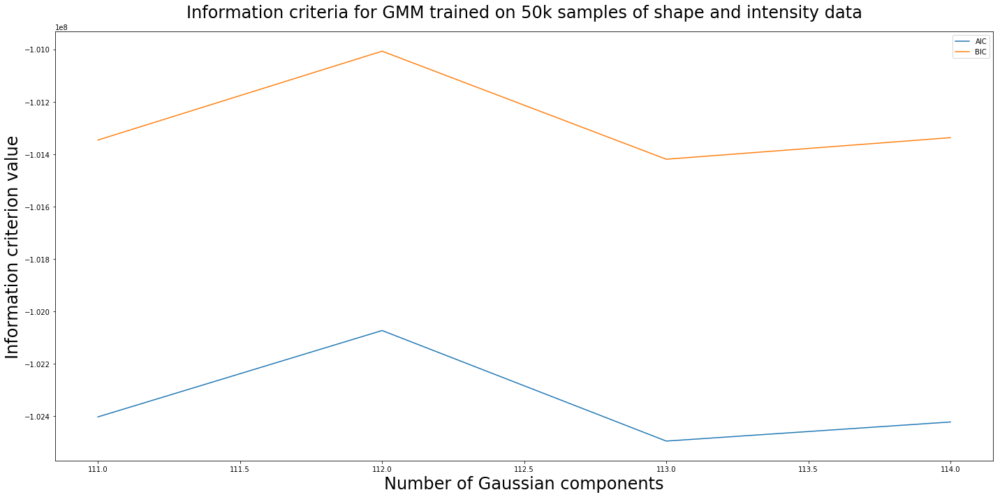

In [107]:
plt.rcParams['figure.figsize'] =[20,10]

plt.plot([111, 112, 113, 114], criteria111_114[0,:], label="AIC") #125
plt.plot([111, 112, 113, 114], criteria111_114[1,:], label="BIC") #125
plt.title("Information criteria for GMM trained on 50k samples of shape and intensity data", pad=20, fontsize=24)
plt.ylabel("Information criterion value", fontsize=24)
plt.xlabel("Number of Gaussian components", fontsize=24)
plt.legend()
plt.tight_layout()
plt.show()

# CLassification

In [125]:
# inv_ob_state = {v: k for k, v in ob_state.items()}

inv_ob_state = {}
for k, v in ob_state.items():
    inv_ob_state[v] = inv_ob_state.get(v, [])
    inv_ob_state[v].append(k)

In [132]:
class_name

['Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'theta',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'mu',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'gamma',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'chi',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'beta',
 'Unknown',
 'chi',
 'chi',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'chi',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'phi',
 'Unknown',
 'Unknown',
 'delta',
 'Unknown',
 'Unknown',
 'alpha',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'theta',
 'theta',
 'Unknown',
 'Unknown',
 'chi',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'theta',
 '

In [126]:
test_set = []
train_set = []

for class_name in ["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"]:
    
    class_obs_all = inv_ob_state[class_name]
    class_obs = []
    for ob in class_obs_all:
        if ob in xxx:
            class_obs.append(ob)
    
    test_obs = np.random.choice(class_obs, size=int(np.ceil(len(class_obs)/3)))
    
    if len(test_obs) == 0:
        print(class_name)
    
    train_obs = []
    for ob in class_obs:
        if ob not in test_obs:
            train_obs.append(ob)
    test_set.append(test_obs)
    train_set.append(train_obs)
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
    
#     test_set = np.random.choice(class_obs, size=)
    
#     np.where(class_name == "class_name")
test_set=np.hstack(test_set)
train_set=np.hstack(train_set)

In [127]:
test_seg_ids=[]
train_seg_ids=[]

for ind_ob, ob in enumerate(xxx):
    if ob in test_set:
        test_seg_ids.append(ind_ob)
    elif ob in train_set:
        train_seg_ids.append(ind_ob)

In [133]:
from sklearn.svm import SVC
SVC_clf = SVC().fit(SAI_data[train_seg_ids], np.array(segment_class)[train_seg_ids])
SVC_clf_score = SVC_clf.score(SAI_data[test_seg_ids], np.array(segment_class)[test_seg_ids])
print(SVC_clf_score)

/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


0.7839606552175465


In [116]:
from sklearn.ensemble import RandomForestClassifier

RF_clf = RandomForestClassifier().fit(SAI_data[train_seg_ids], np.array(segment_class)[train_seg_ids])
RF_clf_score = RF_clf.score(SAI_data[test_seg_ids], np.array(segment_class)[test_seg_ids])
print(RF_clf_score)

/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/sklearn/ensemble/forest.py:248: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.6515740380878352


In [117]:
from sklearn.neighbors import KNeighborsClassifier
KNN_clf = KNeighborsClassifier().fit(SAI_data[train_seg_ids], np.array(segment_class)[train_seg_ids])
KNN_clf_score = KNN_clf.score(SAI_data[test_seg_ids], np.array(segment_class)[test_seg_ids])
print(KNN_clf_score)

0.6456665371162068


In [134]:
preds = SVC_clf.predict(SAI_data[test_seg_ids])

In [ ]:
for class_name in ["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"]:

for 

In [135]:
from sklearn.metrics import classification_report
print(classification_report(np.array(segment_class)[test_seg_ids], preds))

              precision    recall  f1-score   support

       alpha       0.95      0.61      0.75      1833
        beta       0.54      0.83      0.66      1141
         chi       0.85      0.87      0.86      9933
       delta       0.54      0.81      0.65       577
         eta       0.25      0.35      0.29       251
       gamma       0.40      0.61      0.48      1043
       kappa       1.00      0.58      0.74      2309
      lambda       0.97      0.93      0.95       698
          mu       0.92      0.87      0.89       335
          nu       0.93      0.87      0.90       573
       omega       0.39      1.00      0.56       137
         phi       0.54      0.60      0.57      1384
         rho       0.95      1.00      0.97      1913
       theta       0.85      0.72      0.78      3086

   micro avg       0.78      0.78      0.78     25213
   macro avg       0.72      0.76      0.72     25213
weighted avg       0.82      0.78      0.79     25213



In [120]:
from scipy import stats
import umap
from sklearn.mixture import GaussianMixture
from scipy.stats import zscore


In [118]:
with open('../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl', 'rb') as f:
    segments_counts = pickle.load(f)
with open('../../../data_GRS1915/468202_len128_s2_4cad_errors_errorfix.pkl', 'rb') as f:
    segments_errors = pickle.load(f)
with open('../../../data_GRS1915/468202_len128_s2_4cad_ids_errorfix.pkl', 'rb') as f:
    id_per_seg = pickle.load(f)

weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
segment_encoding_dir = '../../../data_GRS1915/segment_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])

with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)
    
segment_encoding_scaled_means = zscore(segment_encoding[:,0,:], axis=None).astype(np.float32)  # standardize

with open('../../../data_GRS1915/468202_segment_GMM_bic_1-3components_zscored.pkl'.format(segment_encoding_dir.split("/")[-1]), 'rb') as f:
    GMM_bics = pickle.load(f)

In [121]:
desc_stats = np.zeros((len(segments_counts), 5)) # median, mean, std, skew, kurt, GM1_bic, GM2_bic, GM3_bic
desc_stats[:,0] = np.median(segments_counts, axis=1).flatten()
desc_stats[:,1] = np.mean(segments_counts, axis=1).flatten()
desc_stats[:,2] = np.std(segments_counts, axis=1).flatten()
desc_stats[:,3] = stats.skew(segments_counts, axis=1).flatten()
desc_stats[:,4] = stats.kurtosis(segments_counts, axis=1).flatten()
zscore_desc_stats = zscore(desc_stats, axis=0)

desc_GM = np.hstack((zscore(desc_stats, axis=0), GMM_bics))

shape_desc_GM = np.hstack((segment_encoding_scaled_means, desc_GM))

In [136]:
SVC_clf2 = SVC().fit(shape_desc_GM[train_seg_ids], np.array(segment_class)[train_seg_ids])
SVC_clf2_score = SVC_clf2.score(shape_desc_GM[test_seg_ids], np.array(segment_class)[test_seg_ids])
print(SVC_clf2_score)

/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


0.8518224725340102


In [137]:
from sklearn.metrics import classification_report
print(classification_report(np.array(segment_class)[test_seg_ids], preds))

              precision    recall  f1-score   support

       alpha       0.95      0.61      0.75      1833
        beta       0.54      0.83      0.66      1141
         chi       0.85      0.87      0.86      9933
       delta       0.54      0.81      0.65       577
         eta       0.25      0.35      0.29       251
       gamma       0.40      0.61      0.48      1043
       kappa       1.00      0.58      0.74      2309
      lambda       0.97      0.93      0.95       698
          mu       0.92      0.87      0.89       335
          nu       0.93      0.87      0.90       573
       omega       0.39      1.00      0.56       137
         phi       0.54      0.60      0.57      1384
         rho       0.95      1.00      0.97      1913
       theta       0.85      0.72      0.78      3086

   micro avg       0.78      0.78      0.78     25213
   macro avg       0.72      0.76      0.72     25213
weighted avg       0.82      0.78      0.79     25213



In [139]:
shape_desc_GM.shape

(468202, 24)

In [ ]:
UMAP_mapper = umap.UMAP(verbose=True)#n_neighbors=50, min_dist=0.0, local_connectivity, repulsion_strength, negative_sample_rate
UMAP_mapper.fit(shape_desc_GM)
    
with open('../../../data_GRS1915/UMAPmapper_shape16latent_8desc_stats_trainedonall.pkl', 'wb') as f:
    pickle.dump(UMAP_mapper, f)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Thu May 28 20:49:21 2020 Finding Nearest Neighbors
Thu May 28 20:49:21 2020 Building RP forest with 39 trees
Thu May 28 20:49:59 2020 NN descent for 19 iterations
	 0  /  19
	 1  /  19
	 2  /  19
	 3  /  19
Thu May 28 20:51:07 2020 Finished Nearest Neighbor Search
Thu May 28 20:51:23 2020 Construct embedding


In [142]:
with open('../../../data_GRS1915/UMAPmapper_shape16latent_8desc_stats_trainedonall.pkl', 'rb') as f:
    UMAP_mapper = pickle.load(f)

In [143]:
umaped_data = UMAP_mapper.transform(shape_desc_GM)

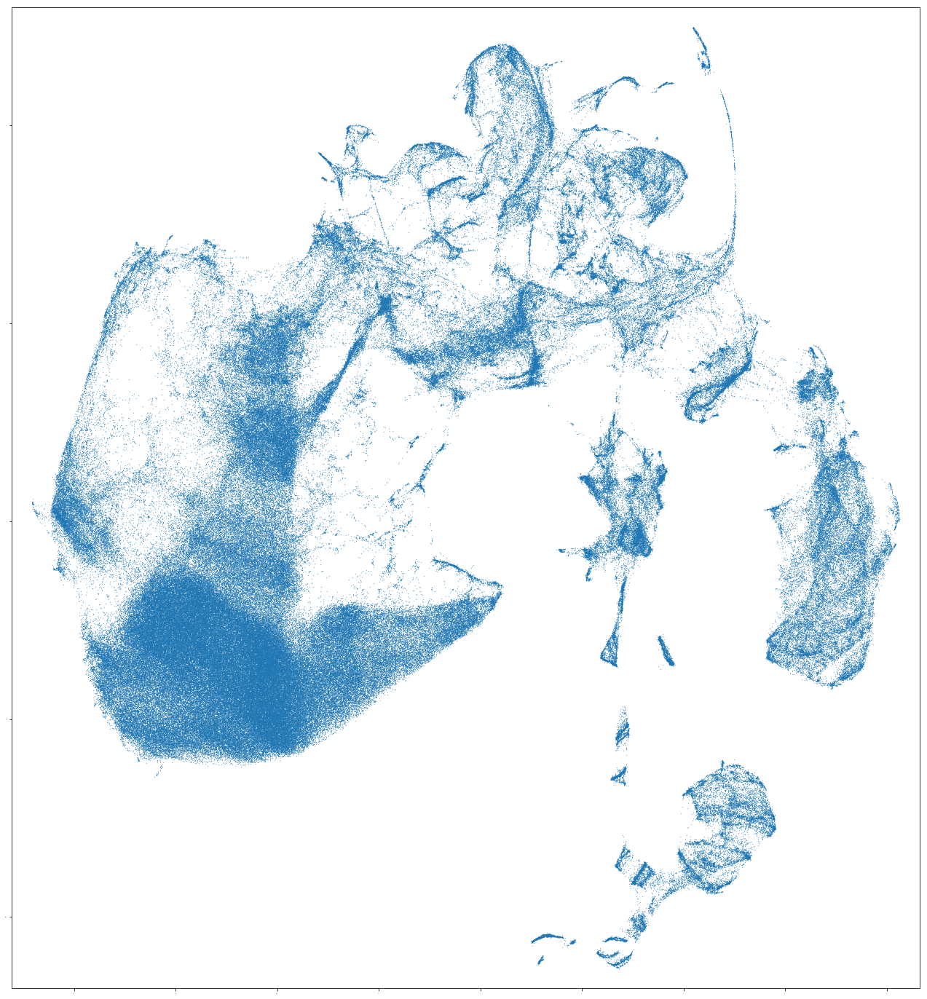

In [144]:
plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.05)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

In [ ]:
weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
segment_encoding_dir = '../../../data_GRS1915/segment_encoding_{}_segments_{}.pkl'.format(weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])

with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)